In [26]:
#Importing Libraries
import os
#Installing dependencies
!pip install music21

import tensorflow  as tf
import numpy as np 
import pandas as pd 
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import sys
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau



Defaulting to user installation because normal site-packages is not writeable


# Generating classical music using LSTM

This notebook's goal is to generate classical music based on the dataset with MIDI classical music, for this case we are using Chopin's artwork. We have created a neural network which outputs two categorical values: the note and the tempo, that should be next in the sequence. This project was our [inspiration]( https://www.kaggle.com/code/karnikakapoor/music-generation-lstm#END).

### Data exploration and processing 

First let's import the data. We are using music21 library which provides an interface for the MIDI files, containing different classes and object present in those musical files. We are saving all the different Chopin's songs into the `all_midis` array.

In [5]:
#Loading the list of chopin's midi files as stream 
filepath = "music2/chopin/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi = converter.parse(tr)
        all_midis.append(midi)

The MIDI object contains a lot of different properties, but we are only interested in notes, chordes and tempo of the song. Just a side note that a chorde is a combination of multiple notes, so we will also treat chorde as one note for simplicity. This function is getting the values that we are interested in. It checks if the current element has the tempo value which is not None and only then it adds the note. When it comes to tempo we are also adding the quarterBPM of the current note, but we will not predict it later.

In [28]:
def extract_notes_and_tempos(file):
    result = []
    for j in file:
        songs = instrument.partitionByInstrument(j)
        for part in songs.parts:
            pick = part.recurse()
            
            current_tempo = None
            for element in pick:
                if isinstance(element, tempo.MetronomeMark):
                    # Store only tempo entries with non-None text
                    current_tempo = {
                        'text': element.text,  # Keep as is, won't be added if None
                        'quarterBPM': element.number,
                    }
                
                if isinstance(element, note.Note) and current_tempo and current_tempo['text'] is not None:
                    note_entry = {
                        'notes': str(element.pitch),
                        'text': current_tempo['text'],
                        'quarterBPM': current_tempo['quarterBPM']
                    }
                    result.append(note_entry)
                
                elif isinstance(element, chord.Chord) and current_tempo and current_tempo['text'] is not None:
                    chord_entry = {
                        'notes': ".".join(str(n) for n in element.normalOrder),
                        'text': current_tempo['text'],
                        'quarterBPM': current_tempo['quarterBPM']
                    }
                    result.append(chord_entry)
    return result

#Getting the list of notes as Corpus
Corpus= extract_notes_and_tempos(all_midis)
# print("Total notes in all the Debussy midis in the dataset:", len(Corpus))
print(np.shape(Corpus), Corpus[0:3])
# print(tempos)

(23708,) [{'notes': 'G3', 'text': 'andante', 'quarterBPM': 71}, {'notes': '0.4', 'text': 'andante', 'quarterBPM': 72}, {'notes': 'E3', 'text': 'andante', 'quarterBPM': 72}]


So you can see that there over 23 thousand objects with properties `notes, text, quarterBPM`. Above there are examples.

In [7]:
# Assuming Corpus is your dictionary or list of dictionaries
from collections import Counter

# Count the occurrences of text values
text_counts = Counter(item['text'] for item in Corpus)

# Print out the counts
for text, count in text_counts.items():
    print(f"Text: {text}, Count: {count}")

# Optional: Total number of entries with text
total_with_text = sum(1 for item in Corpus if item['text'] is not None)
print(f"\nTotal entries with text: {total_with_text}")

Text: andante, Count: 368
Text: andantino, Count: 688
Text: andante moderato, Count: 1127
Text: adagietto, Count: 237
Text: larghetto, Count: 935
Text: adagio, Count: 720
Text: largo, Count: 642
Text: grave, Count: 188
Text: largamente, Count: 183
Text: vivace, Count: 1368
Text: vivacissimo, Count: 1374
Text: molto allegro, Count: 1548
Text: allegro, Count: 1439
Text: animato, Count: 2033
Text: presto, Count: 357
Text: allegrissimo, Count: 1602
Text: allegretto, Count: 2138
Text: allegro moderato, Count: 2492
Text: maestoso, Count: 1402
Text: moderate, Count: 1336
Text: lento, Count: 905
Text: prestissimo, Count: 626

Total entries with text: 23708


In [8]:
def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:        
        # Adding the tempo
        tempoEvent = tempo.MetronomeMark(text=i['text'])
        tempoEvent.offset=offset
        Melody.append(tempoEvent)

        # Checking if the note is a chord, else it's a note
        note_or_chord = i['notes']
        if ("." in note_or_chord or note_or_chord.isdigit()):
            chord_notes = note_or_chord.split(".") #Seperating the notes in chord
            notes = [] 
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)            
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else: 
            note_snip = note.Note(note_or_chord)
            note_snip.offset = offset
            Melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)   
    return Melody_midi

Melody_Snippet = chords_n_notes(Corpus[:100])
Melody_Snippet.write('midi', "Generated.mid")


'Generated.mid'

In [9]:
print("First fifty values in the Corpus:", [item['notes'] for item in Corpus[:10]])

First fifty values in the Corpus: ['G3', '0.4', 'E3', '0.4.7', 'A4', 'G3', '5.7', '2.5.7', '0.4', 'A4']


**Examine all the notes in the Corpus** 

In [10]:
#Creating a count dictionary
count_num = Counter([tuple(item['notes']) for item in Corpus])
print("Total unique notes in the Corpus:", len(count_num))

Total unique notes in the Corpus: 337


In [11]:
#Exploring the notes dictionary
Notes = list(count_num.keys())
Recurrence = list(count_num.values())
#Average recurrenc for a note in Corpus
def Average(lst):
    return sum(lst) / len(lst)
print("Average recurrenc for a note in Corpus:", Average(Recurrence))
print("Most frequent note in Corpus appeared:", max(Recurrence), "times")
print("Least frequent note in Corpus appeared:", min(Recurrence), "time")

Average recurrenc for a note in Corpus: 70.35014836795253
Most frequent note in Corpus appeared: 839 times
Least frequent note in Corpus appeared: 1 time


Clearly, there are some very rare notes in the melody; some so rare that it was played only once in the whole data. This would create a lot of problems. (I did run into most of them while writing this piece)
To spare us the error reports, let us have a look at the frequency of the notes. 
And for simplicity, I shall be eliminating some of the least occurring notes. I am sure Chopin wouldn't mind me messing with his masterpiece for science or would he? Either way, I may never know!   

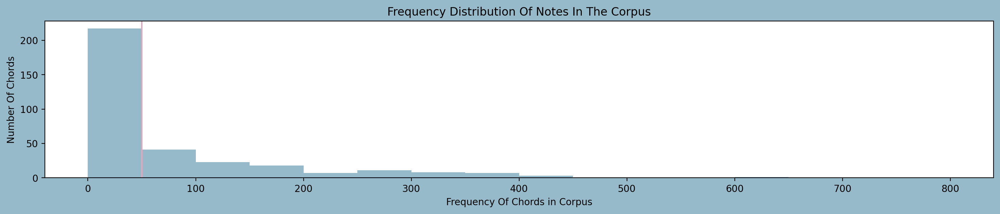

In [12]:
# Plotting the distribution of Notes
plt.figure(figsize=(18,3),facecolor="#97BACB")
bins = np.arange(0,(max(Recurrence)), 50) 
plt.hist(Recurrence, bins=bins, color="#97BACB")
plt.axvline(x=50,color="#DBACC1")
plt.title("Frequency Distribution Of Notes In The Corpus")
plt.xlabel("Frequency Of Chords in Corpus")
plt.ylabel("Number Of Chords")
plt.show()

In [13]:
#Getting a list of rare chords
rare_note = []
for index, (key, value) in enumerate(count_num.items()):
    if value < 50:
        m =  ''.join(key)
        rare_note.append(m)
        
print("Total number of notes that occur less than 100 times:", len(rare_note))

Total number of notes that occur less than 100 times: 217


In [14]:
#Eleminating the rare notes
for element in Corpus:
    if element['notes'] in rare_note:
        Corpus.remove(element)

print("Length of Corpus after elemination the rare notes:", len(Corpus))

Length of Corpus after elemination the rare notes: 21688


## Data preprocessing (continued)

Here we will continue the data preprocessing. Below you can see the data in a Data Frame.

In [15]:
df = pd.DataFrame(Corpus)
df

,notes,text,quarterBPM
0,G3,andante,71.00
1,0.4,andante,72.00
2,E3,andante,72.00
3,A4,andante,73.50
4,G3,andante,74.00
...,...,...,...
21683,9,prestissimo,208.00
21684,1,prestissimo,208.00
21685,5,prestissimo,209.50
21686,1,lento,52.34


Notes and tempo text are categorical values and those need to be encoded. For this we will use label encoding which assigns a label as integer from 0 to number of classes.

In [16]:
from sklearn.preprocessing import LabelEncoder

df = pd.DataFrame(Corpus)
df

# Initialize label encoders
text_encoder = LabelEncoder()
notes_encoder = LabelEncoder()



# Fit and transform the text and referent columns
df['text_encoded'] = text_encoder.fit_transform(df['text'])
df['notes'] = notes_encoder.fit_transform(df['notes'])
# Optional: Create reverse mappings if needed
text_mapping = dict(zip(text_encoder.classes_, text_encoder.transform(text_encoder.classes_)))
notes_mapping = dict(zip(notes_encoder.classes_, notes_encoder.transform(notes_encoder.classes_)))

print("Text mapping:", text_mapping)
print("Notes mapping:", notes_mapping)

df = df.drop(columns='text')
df


Text mapping: {'adagietto': 0, 'adagio': 1, 'allegretto': 2, 'allegrissimo': 3, 'allegro': 4, 'allegro moderato': 5, 'andante': 6, 'andante moderato': 7, 'andantino': 8, 'animato': 9, 'grave': 10, 'largamente': 11, 'larghetto': 12, 'largo': 13, 'lento': 14, 'maestoso': 15, 'moderate': 16, 'molto allegro': 17, 'prestissimo': 18, 'presto': 19, 'vivace': 20, 'vivacissimo': 21}
Notes mapping: {'0': 0, '0.1': 1, '0.2': 2, '0.2.5': 3, '0.2.6': 4, '0.3': 5, '0.3.5': 6, '0.3.6': 7, '0.3.7': 8, '0.4': 9, '0.4.6': 10, '0.4.7': 11, '0.5': 12, '0.6': 13, '1': 14, '1.2': 15, '1.2.3': 16, '1.3': 17, '1.3.7': 18, '1.3.8': 19, '1.4': 20, '1.4.6': 21, '1.4.7': 22, '1.4.7.10': 23, '1.4.7.9': 24, '1.5': 25, '1.5.6': 26, '1.5.8': 27, '1.6': 28, '1.7': 29, '10': 30, '10.0': 31, '10.0.3.6': 32, '10.1': 33, '10.1.4': 34, '10.1.5': 35, '10.11': 36, '10.2': 37, '10.2.5': 38, '10.3': 39, '11': 40, '11.0': 41, '11.0.4': 42, '11.1': 43, '11.1.5': 44, '11.2': 45, '11.2.5': 46, '11.2.6': 47, '11.3': 48, '11.4': 49,

,notes,quarterBPM,text_encoded
0,212,71.00,6
1,9,72.00,6
2,187,72.00,6
3,145,73.50,6
4,212,74.00,6
...,...,...,...
21683,129,208.00,18
21684,14,208.00,18
21685,86,209.50,18
21686,14,52.34,14


Above you can see that e.g **andantane** was given a label **6** and in the text_encoded column this value is present.

In [17]:
uniqueNotesCount = len(notes_mapping)
uniqueTextCount = len(text_mapping)
uniqueNotesCount, uniqueTextCount

(216, 22)

This is how many classes there for notes and tempo respecitvely. Imagine that we were supposed to one-hot-encode that. It would lead to creation of a lot of columns which would then increase the run time of the Neural Network. That is why we believe it is better to go with the label encoding.

The next step is to create sequences with the features and the targerts. What we are doing here is to create a list by appending sequences with length 40 and the next object after this one specific sequence at the same index in X and y correspondingly. That way we create one X (feature) value and the Y (target).

In [18]:
#Splitting the Corpus in equal length of strings and output target
length = 40 #PLAY WITH THIS VALUE
CorpusCopy = df.to_numpy()
L_corpus = len(CorpusCopy)  # length of corpus 
X = [] #The things which will be predicting from, e.g. last 20 data points
y = [] #The things we want to predict based on X


for i in range(0, L_corpus - length, 1):
    X.append(CorpusCopy[i:i+length])
    y.append(CorpusCopy[i+length])
    
L_datapoints = len(y)
print("Total number of sequences in the Corpus:", L_datapoints)
np.shape(X), np.shape(y)

Total number of sequences in the Corpus: 21648


((21648, 40, 3), (21648, 3))

**Splitting Train, Validation and Test datasets**

In [19]:
#Taking out a subset of data to be used as seed

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val= train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=42)


In [20]:
X_train, y_train

([array([[189.  ,  88.2 ,  15.  ],
         [ 74.  ,  88.2 ,  15.  ],
         [183.  ,  88.66,  15.  ],
         [163.  ,  88.2 ,  15.  ],
         [ 86.  ,  88.2 ,  15.  ],
         [ 31.  ,  88.2 ,  15.  ],
         [ 33.  ,  88.2 ,  15.  ],
         [145.  ,  88.2 ,  15.  ],
         [151.  ,  88.2 ,  15.  ],
         [ 86.  ,  88.2 ,  15.  ],
         [169.  ,  88.2 ,  15.  ],
         [163.  ,  80.81,   8.  ],
         [ 33.  ,  80.81,   8.  ],
         [164.  ,  84.51,   7.  ],
         [170.  ,  84.51,   7.  ],
         [ 89.  ,  84.51,   7.  ],
         [152.  ,  84.51,   7.  ],
         [209.  ,  87.74,  15.  ],
         [ 33.  ,  87.74,  15.  ],
         [196.  ,  86.81,  15.  ],
         [183.  ,  84.51,   7.  ],
         [ 89.  ,  81.73,   8.  ],
         [130.  ,  81.73,   8.  ],
         [ 86.  ,  84.51,   7.  ],
         [ 89.  ,  84.97,   7.  ],
         [ 86.  ,  87.28,  15.  ],
         [ 89.  ,  87.74,  15.  ],
         [ 89.  ,  86.35,  15.  ],
         [ 45.  ,  8

## Builiding the Model

Here is the input shape which represent the length of one sequence and the shape of one of the objects in that sequence. This is object is, of course, `notes, quarterBPM, text_encoded`.

In [21]:
input_shape = (np.shape(X)[1], np.shape(X)[2])# (timesteps, features)
input_shape 

(40, 3)

For this case we are using the Functional API instead of Sequential as we have two seperate values that we want to output. There are two LSTM layers, as well as, batch normalizations which increase the performance by lowering the runtime and reducing overfitting. Dropout layers are there to reduce overfitting. We also set `loss_weights` for notes to be **0.6** and **1.2** for tempo texts. The `loss_weights` is responsible for how each of the loses affect the general loss of the model which later is used to update the weights. That way we are telling the model that correctly predicting the tempo is more important the notes. This might not be ideal, but this was our choice and thanks to that the predicted music will behave differently than the one from Kaggle that we used as inspiration.

In [22]:
# Define input shape
input_shape = (np.shape(X)[1], np.shape(X)[2])  # (timesteps, features)

inputs = Input(shape=input_shape, name='input')

from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

# LSTM with regularization and batch normalization
lstm1 = LSTM(512,
             return_sequences=True,
             recurrent_dropout=0.4,
             name='1stLSTM')(inputs)
batch_norm1 = BatchNormalization(name='1stBatchNorm')(lstm1)
dropout1 = Dropout(0.4, name='1stDropout')(batch_norm1)

lstm2 = LSTM(256,
             recurrent_dropout=0.3,
             name='2ndLSTM')(dropout1)
batch_norm2 = BatchNormalization(name='2ndBatchNorm')(lstm2)
dropout2 = Dropout(0.4, name='2ndDropout')(batch_norm2)

# Dense layer with regularization and batch normalization
dense_shared = Dense(256, name='Dense')(dropout2)
batch_norm_dense = BatchNormalization(name='DenseBatchNorm')(dense_shared)

# Output heads with softmax activation for categorical outputs
output_notes = Dense(uniqueNotesCount, activation='softmax', name='notes')(dense_shared)
output_text = Dense(uniqueTextCount, activation='softmax', name='text')(dense_shared)

# Create model with multiple outputs
model = Model(inputs=inputs, outputs=[output_notes, output_text])

# Compile model with sparse categorical crossentropy

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(
    monitor='loss', 
    patience=10, 
    restore_best_weights=True
)

# Learning rate reduction
reduce_lr = ReduceLROnPlateau(
    monitor='loss', 
    factor=0.2,  # Reduce learning rate by 80%
    patience=5, 
    min_lr=0.0001
)


opt = Adamax(learning_rate=0.01)
model.compile(
    optimizer=opt,
    loss={
        'notes': 'sparse_categorical_crossentropy',
        # 'numbers': 'MSE',
        'text': 'sparse_categorical_crossentropy'
    },
    loss_weights={
        'notes': 0.8,
        # 'numbers': 1.0,
        'text': 1.2
    }
)

Here you can see the layers and the number of outputs and trainable parameters.

In [23]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 40, 3)     │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ 1stLSTM (LSTM)      │ (None, 40, 512)   │  1,056,768 │ input[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ 1stBatchNorm        │ (None, 40, 512)   │      2,048 │ 1stLSTM[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ 1stDropout          │ (None, 40, 512)   │          0 │ 1stBatchNorm[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ 2ndLSTM (LSTM)      │ (None, 256)       │    787,456 │ 1stDropout[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ 2ndBatchNorm        │ (None, 256)       │      1,024 │ 2ndLSTM[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ 2ndDropout          │ (None, 256)       │          0 │ 2ndBatchNorm[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense (Dense)       │ (None, 256)       │     65,792 │ 2ndDropout[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ notes (Dense)       │ (None, 216)       │     55,512 │ Dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ text (Dense)        │ (None, 22)        │      5,654 │ Dense[0][0]       │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,974,254 (7.53 MB)

 Trainable params: 1,972,718 (7.53 MB)

 Non-trainable params: 1,536 (6.00 KB)

Here we are spliting the data into seperate targets for notes and text. After that we are transforming it into the tensorflow data format so that it works correclty with the NN.

In [24]:
# Split y into separate target arrays for each set
y_notes_train = [x[0] for x in y_train]      
y_numbers_train = [x[1] for x in y_train]    
y_text_train = [x[2] for x in y_train]

# Validation set
y_notes_val = [x[0] for x in y_val]
y_numbers_val = [x[1] for x in y_val]
y_text_val = [x[2] for x in y_val]


# Training set 
y_notes_train = tf.stack(y_notes_train)
y_numbers_train = tf.stack(y_numbers_train)
y_text_train = tf.stack(y_text_train)

# Validation set
y_notes_val = tf.stack(y_notes_val)
y_numbers_val = tf.stack(y_numbers_val)
y_text_val = tf.stack(y_text_val)

X_train = tf.stack(X_train)
X_val = tf.stack(X_val)

The model is trained on 200 epochs with batch size 256.

In [25]:
# Train the model with validation data
history = model.fit(
    X_train,
    {
        'notes': y_notes_train,
        'text': y_text_train
    },
    epochs=20,
    batch_size=256,
    validation_data=(
        X_val,
        {
            'notes': y_notes_val,
            'text': y_text_val
        }
    ),
    callbacks= [early_stopping, reduce_lr]
)

Epoch 1/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 36s 504ms/step - loss: 7.5848 - notes_loss: 4.3905 - text_loss: 3.1940 - val_loss: 7.7667 - val_notes_loss: 3.7445 - val_text_loss: 4.0112 - learning_rate: 0.0100
Epoch 2/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 28s 501ms/step - loss: 5.1850 - notes_loss: 3.6366 - text_loss: 1.5486 - val_loss: 6.9320 - val_notes_loss: 3.6115 - val_text_loss: 3.3084 - learning_rate: 0.0100
Epoch 3/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 28s 508ms/step - loss: 4.8178 - notes_loss: 3.4427 - text_loss: 1.3752 - val_loss: 6.8422 - val_notes_loss: 3.5653 - val_text_loss: 3.2640 - learning_rate: 0.0100
Epoch 4/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 28s 517ms/step - loss: 4.6364 - notes_loss: 3.3485 - text_loss: 1.2876 - val_loss: 6.1132 - val_notes_loss: 3.4648 - val_text_loss: 2.6348 - learning_rate: 0.0100
Epoch 5/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 29s 524ms/step - loss: 4.4822 - notes_loss: 3.2674 - text_loss: 1.2148 - val_loss: 5.6698 - val_notes_loss: 3.4136 - val_text_loss: 2.2446 - learning_rate: 0.

KeyboardInterrupt: 

Below you can see how the model performs in regards to general loss, notes loss and tempo text loss.

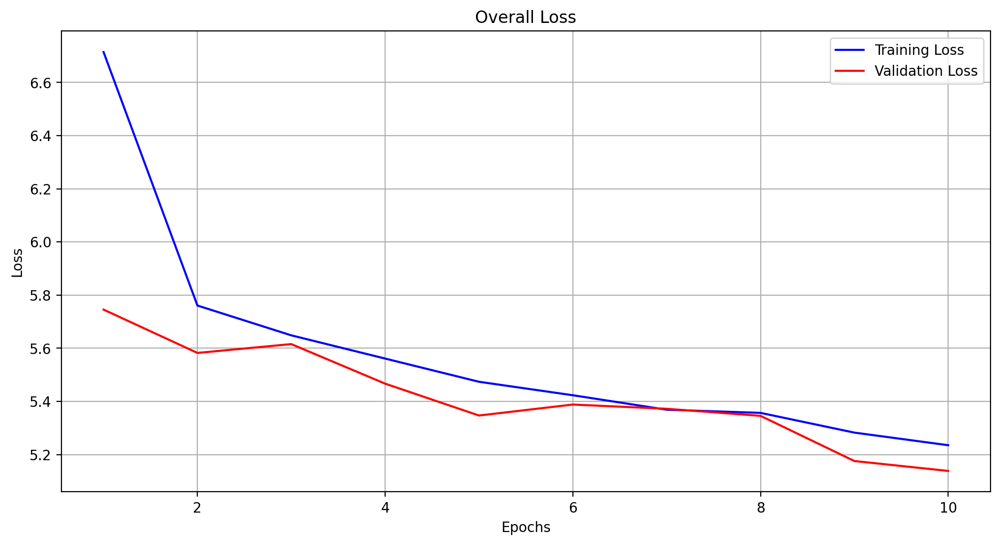

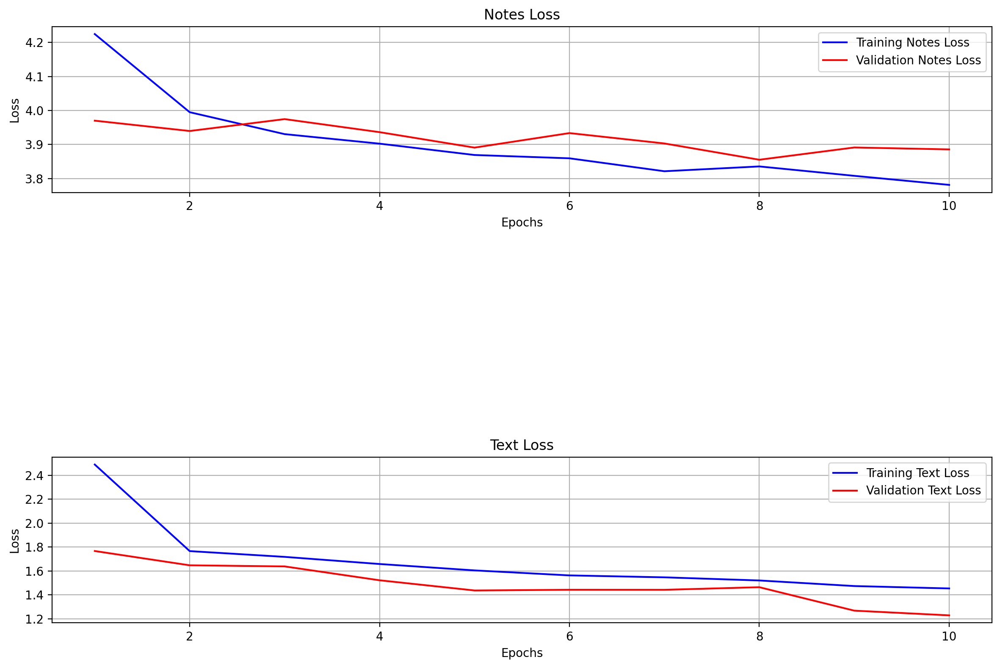

In [ ]:
import matplotlib.pyplot as plt

# Extract losses from the history object
epochs = range(1, len(history.history['loss']) + 1)

# Overall loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Losses for individual outputs
notes_loss = history.history['notes_loss']
val_notes_loss = history.history['val_notes_loss']

# numbers_loss = history.history['numbers_loss']
# val_numbers_loss = history.history['val_numbers_loss']

text_loss = history.history['text_loss']
val_text_loss = history.history['val_text_loss']

# Plot overall loss
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
plt.title('Overall Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

# Plot individual losses
plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
plt.plot(epochs, notes_loss, 'b-', label='Training Notes Loss')
plt.plot(epochs, val_notes_loss, 'r-', label='Validation Notes Loss')
plt.title('Notes Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# plt.subplot(3, 1, 2)
# plt.plot(epochs, numbers_loss, 'b-', label='Training Numbers Loss')
# plt.plot(epochs, val_numbers_loss, 'r-', label='Validation Numbers Loss')
# plt.title('Numbers Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()
# plt.grid()

plt.subplot(3, 1, 3)
plt.plot(epochs, text_loss, 'b-', label='Training Text Loss')
plt.plot(epochs, val_text_loss, 'r-', label='Validation Text Loss')
plt.title('Text Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


## Let's generate the melody and test the model!

First let's show an example of how the model is predicting. Below you can see it is choosing random sequence of the length 40 and using that to predict next value in the sequence. 

In [ ]:
sampleSeed = X_test[np.random.randint(0,len(X_test)-1)]
sampleSeed = sampleSeed.reshape(1, 40, 3) 
samplePrediction = model.predict(sampleSeed, verbose=0)

Below is the index of the note which was predicted with the highest probability.

In [ ]:
index = np.argmax(samplePrediction[0][0]) # index of the most probable note
index, samplePrediction[0][0][index]

(131, 0.08027333)

This value was then transformed back to the following note.

In [ ]:
notes_encoder.inverse_transform([index])[0]

'E4'

Here is the index of the tempo text and its probability. 

In [ ]:
indexText = np.argmax(samplePrediction[1][0])
indexText, samplePrediction[1][0][indexText]

(2, 0.26123643)

It was transformed backed to corresponding tempo text into this beautiful italian word.

In [ ]:
text_encoder.inverse_transform([indexText])

array(['allegretto'], dtype=object)

And here you can see that we can get the BPM out of the tempo object so there is no need to predict the BPM value.

In [ ]:
tempo.MetronomeMark(text='andante moderato').getQuarterBPM()

83.0

In [ ]:
def generateMelody(Note_Count, temperature=1.0):
    # Get random sequence of given length (40) objects from the test set
    seed = X_test[np.random.randint(0,len(X_test)-1)]
    Music = []
    for i in range(Note_Count):
        # Reshaping the input to be (batch size, 40, 3)
        seed = seed.reshape(1,40,3)

        # Predicting and extracting notes and tempo text
        prediction = model.predict(seed, verbose=0)
        notesPredictions = prediction[0][0]
        tempoTextPredicitons = prediction[1][0]

        # Applying temperature - 
        #   higher value (2.0) - more creative predictions
        #   lower value (0.5) - less creative, more precise
        notesPredictions = np.log(notesPredictions) / temperature
        exp_preds = np.exp(notesPredictions)
        notesPredictions = exp_preds / np.sum(exp_preds)

        tempoTextPredicitons = np.log(tempoTextPredicitons) / temperature
        exp_preds = np.exp(tempoTextPredicitons)
        tempoTextPredicitons = exp_preds / np.sum(exp_preds)

        # Getting the prediction with highest probability
        indexNote = np.argmax(notesPredictions)
        indexTempoText = np.argmax(tempoTextPredicitons)

        # Inverse the encoding process
        note = notes_encoder.inverse_transform([indexNote])[0]
        tempoText = text_encoder.inverse_transform([indexTempoText])[0]

        # Create one object and append it into Music array
        onePrediction = {'notes': note, 'text': tempoText}
        print(onePrediction)
        Music.append(onePrediction)
        
        # Move the 'window' for the next predictions
        # by removing the first object from the sequence 
        # at index 0, where index 40 is the last index before making the prediction
        # After removal, append the object that was just predicted, 
        # apply transformations to encode this object.
        newSample = np.array([
            notes_encoder.transform([note])[0],  # Transform the predicted note back to numeric
            tempo.MetronomeMark(text=tempoText).getQuarterBPM(),
            text_encoder.transform([tempoText])[0]  # Transform the predicted tempo text back to numeric
        ])
        print(newSample)
        seed = np.roll(seed, -1, axis=1)
        seed[0, -1, :] = newSample
        # print(newSample, seed)


    #The Music file contains objects {note, text} and we transform it into Midi file.
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)   
    return Music,Melody_midi


#getting the Notes and Melody created by the model
Music_notes, Melody = generateMelody(20,0.5)


{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]
{'notes': 'A4', 'text': 'andante'}
[96. 72.  6.]


This sure looks like music! To check if it sounds like music we have to listen to the MIDI file. Playing midi is crumblesome. I have saved and converted a few generated melodies to ".wav" format outside of this notebook. So let us have a listen. 

**Melody Generated Sample 1**

In [ ]:
#To save the generated melody
Melody.write('midi','Melody_GeneratedE10NoNone.mid')
#to play audio or corpus
# IPython.display.Audio("../input/music-generated-lstm/Melody_Generated 2.wav")

'Melody_GeneratedE10NoNone.mid'

**Melody Generated Sample 2**

In [29]:
#to play audio or corpus
IPython.display.Audio("Melody_GeneratedN2v2T0.8.wav")

# Conclusions

This was an interesting journey to have a go at generating classical music that have showed us that tasks like this can be computationally heavy and they require a lot of time to converge into something meaningful. The results of this has tought us the importance of the `loss_weights`, the usage of `Functional` API and the usage of `temperature` to generate diverse music files. It was a great learning experience and we are eager to talk about during the exam! We hope you liked it. 


Here is a little taste of how we were working on this assingment. 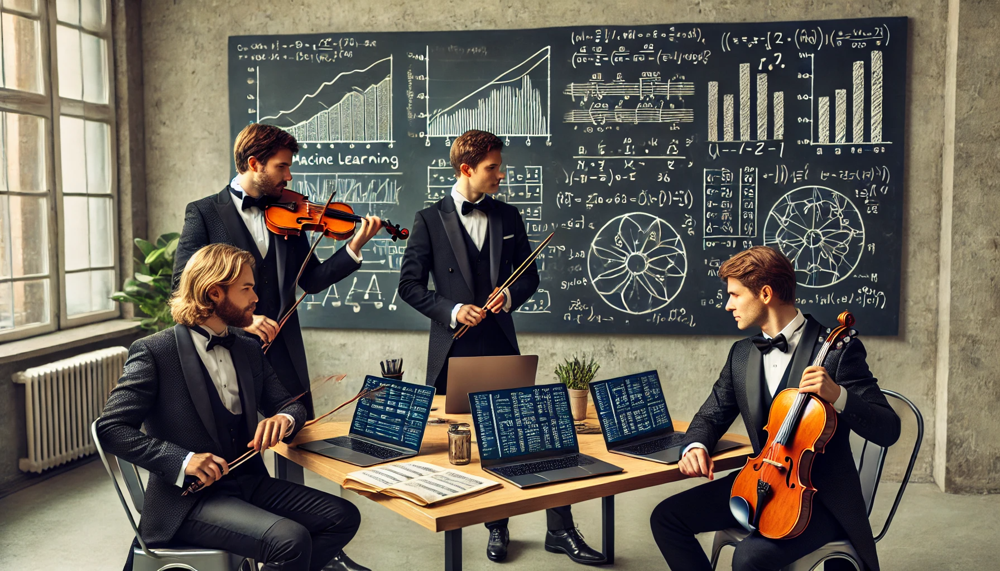